<a href="https://colab.research.google.com/github/Guri10/Data-Science-and-Machine-Learning/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem 

Identifying the breed of dog given an image of a dog.

## 2. Data

The Data we're using is from Kaggle's Dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evalution is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data: 
* we are dealing with images (unstructured data) so it is probably best we use deep learning / transfer learning.
* There are 120 breeds of dogs (120 different classes.
* There are arond 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the set (these images have no labels , because we'll want to predict them).

In [ ]:
# Unzip our data into Google drive

#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# Get our workspace ready

* Import TensorFlow 2.x✅:
* Import TensorFlow Hub✅:
* Make sure we are using GPU✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: " , tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(" ) 

TF version:  2.7.0
TF Hub version:  0.12.0
GPU available (YESSSS!!!)


## Getting our data ready (turning into tensors)
converting our images into numerical format

Lets start by accessing our data and checking out the labels


In [ ]:
# Checkout labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     073f0821a0842917e6e97ab322bd63f2  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


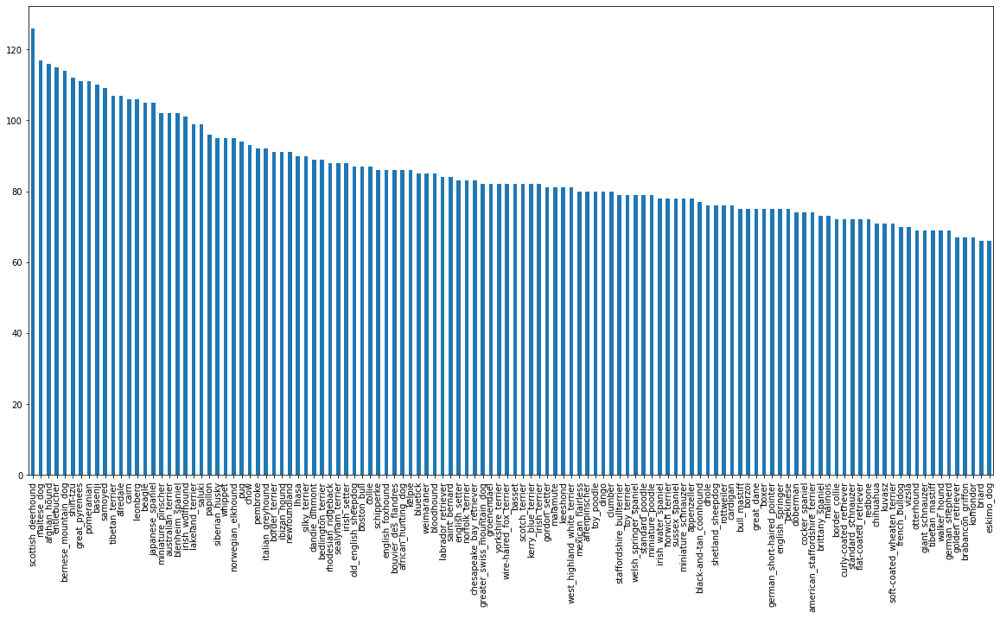

In [ ]:
# How many images are there of eeach breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

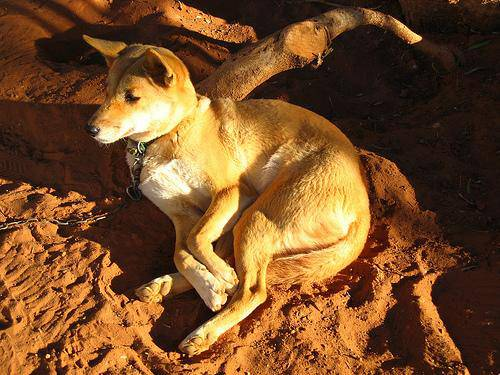

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file paterns

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Getting pathnames from image ID's

filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv['id']]

# Checking the first 10
filenames[:10]


['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/My Drive/Dog Vision/train/")[:10]

['e0629e36f6f2f4708db4b4d68bf1a75e.jpg',
 'e5831fcb399c887cb0ac1e3a3d229f7b.jpg',
 'e0c2b69fc53eeb74dfbf31a1ce54b11a.jpg',
 'e0cfa8c273838e25d74970683b285391.jpg',
 'e146cabda18bbb2cb402dece1a7dd4ef.jpg',
 'e09cf0d6051273932911650565c30e0f.jpg',
 'e5064451d5ce1b406452427679281bbc.jpg',
 'e63ce7912e8a260513f3d4d9db3eaa62.jpg',
 'e346c77b51b03999cbf7d89ae776e696.jpg',
 'dc226c922a709fd866d25d7d93b859c9.jpg']

In [ ]:
# Check the number of filenames matches number of the actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed.")
else:
  print("Files do not match actual of files check the target directory.")

Filenames match actual amount of files! Proceed.


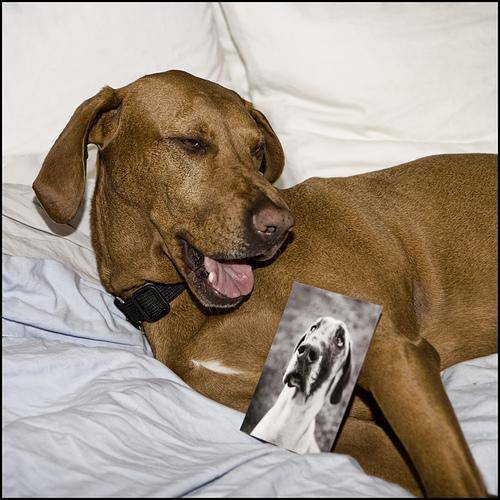

In [ ]:
Image(filenames[100])

In [ ]:
labels_csv["breed"][100]

'rhodesian_ridgeback'

Since wehave got our training image filepaths in alist, lets prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# check if number of labels matches the number of filenames
if len(labels ) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames


In [ ]:
# Find the unique labels values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into a array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Indecx where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're goind to start experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES =  1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training  and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have a look at training data
X_train[:5], y_train[:5]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing images (turing images into tensors)

To preprocess our images into Tensors we are going to write a function which does a few things

1. Take a image filepath as input
2. Use TensorFlow to read the file and save it to a variable
3. Turn our `image` (a jpg) into Tensors
4. resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

In [ ]:
# Convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we'hve seen how a image looks like as a Tensor, let's make a function to preprocess them.

1. Take a image filepath as input
2. Use TensorFlow to read the file and save it to a variable
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel from 0-255 to 0-1)
5. resize the `image` to be a shape of (244, 244)
6. Return the modified `image`

In [ ]:
# define image size
IMG_SIZE = 224

# Create a function for preprocesing images
def process_image(image_path, image_size=IMG_SIZE):
  """
    Takes an image path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (like normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into Batches

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image ,label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of tensors in the form: `(image, label)`, let's make a function to turn all of our data(X and y) into batches

In [ ]:
# Define the batchsize, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # inly filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  ## If the data is valid datasset, we don't need to shuffle it
  elif valid_data:
    print("Creating Validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y)))# labels
    data_batch =data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
    
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels efore mapping image processor function is aster then shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True )

Creating training data batches...
Creating Validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizining Data Batches

Our data is in batches ...this can be hard to comprehend, lets visualize the batches


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displalys a plot of 25 images and their labels from a data batch.
  """
  #Setup a figure
  plt.figure(figsize=(10,10))
  # Loop through 25 
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[1.27722353e-01, 1.31643921e-01, 6.88988119e-02],
          [1.31854698e-01, 1.35776266e-01, 7.30311647e-02],
          [1.34243712e-01, 1.38165280e-01, 7.54201710e-02],
          ...,
          [1.69756949e-01, 1.22479595e-01, 8.59511346e-02],
          [5.74122518e-02, 2.68525574e-02, 7.59365212e-04],
          [4.42321859e-02, 2.91494485e-02, 1.39974514e-02]],
 
         [[1.42892867e-01, 1.35049731e-01, 7.62261972e-02],
          [1.49019614e-01, 1.41176477e-01, 8.23529437e-02],
          [1.49019614e-01, 1.41176477e-01, 8.23529437e-02],
          ...,
          [1.44852117e-01, 1.13710806e-01, 7.20284134e-02],
          [4.19187211e-02, 2.43289471e-02, 6.18178688e-04],
          [3.61968502e-02, 2.86420062e-02, 1.29992915e-02]],
 
         [[1.39415860e-01, 1.31257594e-01, 7.24340603e-02],
          [1.42165631e-01, 1.34007365e-01, 7.51838237e-02],
          [1.46043435e-01, 1.37885168e-01, 7.90616274e-02],
          ...,
          [1.18591622e-01, 9.81611535e-02, 5.2237

In [ ]:
len(train_images), len(train_labels)

(32, 32)

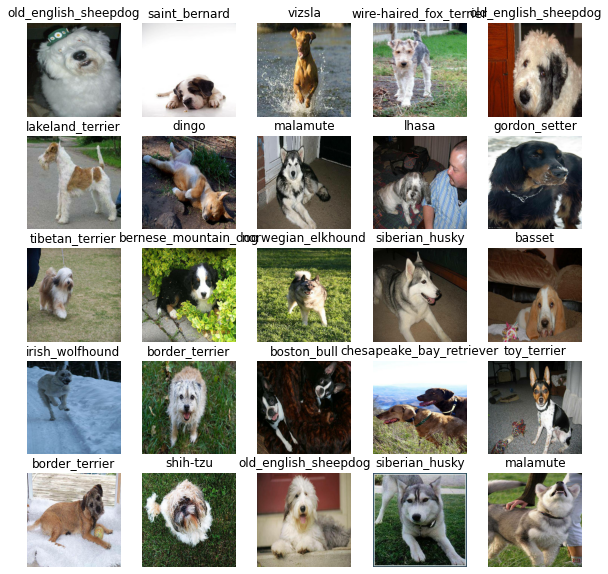

In [ ]:
# Now lets visualize the data in a trianing datset
show_25_images(train_images, train_labels)

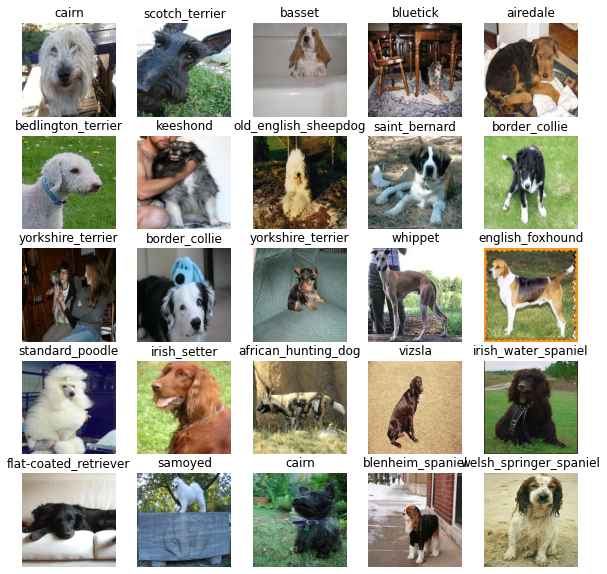

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images, in the form of Tensors) to our model.
* The output shape (image lables, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub.

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batche , height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URl from TesnorFlow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got our inputs , outputs and model ready to go.
Let us put them together into a Keras deep Learing model:

Knowing this, let us create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this then that).
* Compiles the model (says it should be evaluated and improved).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras function
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with :", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1(input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model 
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper function a model can use during training to do things like:
* check its progress
* stop training early if a model stops improving

We'll create 2 callbacks:
1. for TensorBoard which helps track our models progress.
2. for early stopping  which prevents our model from training for too long.

## TesnorBoard Callback

To setup a Tensorboard callback, we need to do 3 things:
1. Load the TesnorBoard notebook extension
2. Create a TesnorBoard callback ehich is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the TensorBoard magic function (we'll do this after model training).

In [ ]:
# Load Tesnorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def Create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs", 
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S") )
  return tf.keras.callbacks.TensorBoard(logdir)
  

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}



In [ ]:
# Check to make sh=ure we are still running on a GPU
print("GPU", "available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YESS!!!)


Let's create a simple funcition that trains a model.

* Create a model using `create_model()`
* Setup a TesnorBoard callback using `Create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs
* return the model

In [ ]:
# Build a function to train and return a model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()

  # Create new TesnorBoard sessio everytime we train a model
  tensorboard = Create_tensorboard_callback()

  # Fit the model to our data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 83s 3s/step - loss: 4.5862 - accuracy: 0.1025 - val_loss: 3.3029 - val_accuracy: 0.3100
Epoch 2/100
25/25 [==============================] - 5s 190ms/step - loss: 1.6353 - accuracy: 0.6988 - val_loss: 2.1376 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 5s 190ms/step - loss: 0.5704 - accuracy: 0.9388 - val_loss: 1.6726 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 4s 176ms/step - loss: 0.2537 - accuracy: 0.9887 - val_loss: 1.4803 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 5s 194ms/step - loss: 0.1471 - accuracy: 0.9975 - val_loss: 1.3999 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1011 - accuracy: 1.0000 - val_loss: 1.3591 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

### Checking the TesnorBoard logs

The TesnorBoard magic function (%tensorboard) will access the logs directory we created 

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 6004), started 0:50:01 ago. (Use '!kill 6004' to kill it.)

<IPython.core.display.Javascript object>

## making and Evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 161ms/step


array([[1.8725620e-03, 3.4368630e-05, 7.0629187e-04, ..., 1.4047985e-04,
        2.8682975e-05, 1.8846309e-03],
       [6.2525147e-03, 1.4910806e-03, 2.0300305e-02, ..., 1.4643066e-03,
        1.0361364e-03, 1.1398707e-04],
       [6.6488399e-05, 6.7782897e-04, 1.7529419e-05, ..., 7.2099974e-05,
        5.5350922e-04, 1.5376737e-04],
       ...,
       [9.0314570e-06, 1.4214386e-05, 2.1840910e-05, ..., 5.1806751e-06,
        8.9913032e-05, 6.8569694e-05],
       [4.2864163e-03, 8.8783498e-05, 2.5260361e-04, ..., 5.1359402e-04,
        2.7721859e-05, 1.0999220e-02],
       [3.6677512e-04, 6.7663546e-05, 1.5001326e-02, ..., 3.3427281e-03,
        8.4505137e-04, 1.4165242e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.05276761e-05 5.28764649e-05 1.92201594e-04 1.15488852e-04
 4.18561837e-03 2.93673424e-04 5.24809177e-04 2.00822297e-03
 1.74394082e-02 9.09096077e-02 3.82402031e-05 4.91908850e-06
 3.31095769e-04 7.26606464e-03 1.34888361e-03 3.62202106e-03
 5.96169048e-05 7.67892983e-04 1.67939812e-04 5.41547430e-04
 3.36987025e-04 1.21769181e-03 9.01787498e-05 8.56298648e-05
 4.30153720e-02 1.63224424e-04 6.29951464e-05 4.55640693e-04
 1.19224773e-04 2.75585218e-04 2.02723095e-04 1.46574996e-04
 1.26752377e-04 1.72274100e-04 7.50273612e-05 1.57018767e-05
 7.17844057e-04 1.00824493e-03 3.53658652e-05 1.41802520e-01
 7.70632410e-04 5.01744216e-05 3.68445273e-03 3.08023882e-05
 5.47684962e-04 4.60252959e-05 3.49125650e-04 1.87125849e-03
 1.18215976e-04 2.31408427e-04 1.89890648e-04 1.52764434e-04
 2.19374619e-04 1.66778918e-03 4.79383998e-05 9.75399103e-04
 1.73023262e-04 3.06554502e-05 1.74588640e-04 4.65576122e-05
 5.08012425e-04 6.72708091e-04 7.55552537e-05 1.21379548e-04
 2.50460813e-04 2.589251

In [ ]:
# Turn prediction probabilities into their repective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probailities into labels.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Since our validation data is still in a batch dataset, we will unoack it to make predictions on the validation images and then compare those predictions to the labels (truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(val_data):
  """
  Takes a batched dataset of (image, labels) Tensors and returns separate arrays 
  of images and labels
  """
  images_ = []
  labels_ = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Functions to visualize

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image  & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color= "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

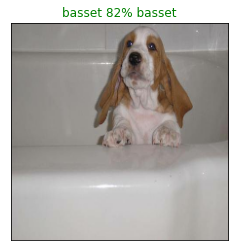

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=2)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest predictions confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of the true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("mediumseagreen")
  else:
    pass

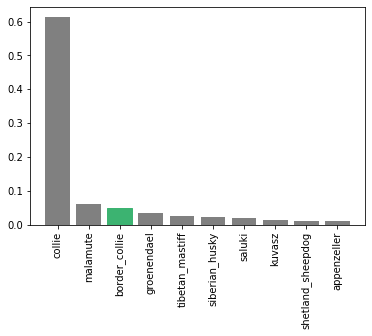

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

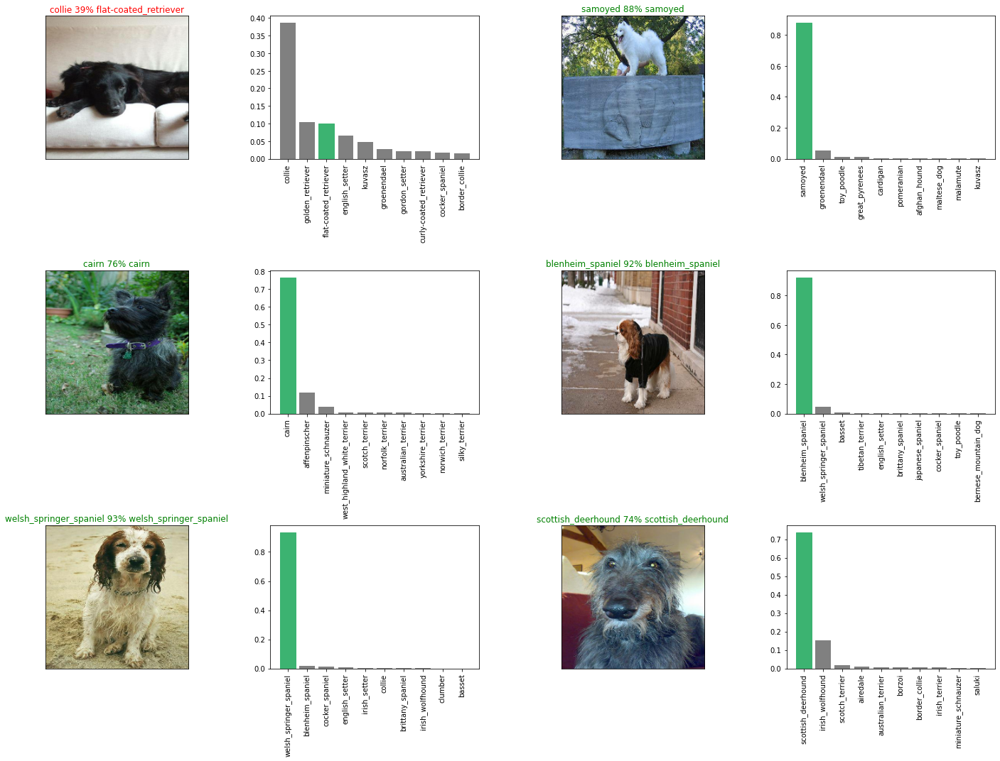

In [ ]:
i_multiplier = 20
num_rows = 3
num_columns = 2
num_images = num_rows*num_columns
plt.figure(figsize=(10*num_columns, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_columns, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_columns, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)  
plt.show()


## Saving and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory  and appends a suffix (string).
  """
  # Create a model directory pathname  with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save the model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20220109-101216-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20220109-101216-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20220109-101216-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20220109-101216-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 121ms/step - loss: 1.2078 - accuracy: 0.6500


[1.2077651023864746, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 122ms/step - loss: 1.2078 - accuracy: 0.6500


[1.2077651023864746, 0.6499999761581421]

## Training the model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train), len(y_train)

(800, 800)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = Create_tensorboard_callback()
# No validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**NOTE:** Running the cell below will take a while (maybe upto 30 min for 1st epoch) because runtime has to load all images into the memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 54s 154ms/step - loss: 1.3144 - accuracy: 0.6730
Epoch 2/100
320/320 [==============================] - 49s 154ms/step - loss: 0.3966 - accuracy: 0.8821
Epoch 3/100
320/320 [==============================] - 53s 165ms/step - loss: 0.2341 - accuracy: 0.9356
Epoch 4/100
320/320 [==============================] - 51s 160ms/step - loss: 0.1548 - accuracy: 0.9620
Epoch 5/100
320/320 [==============================] - 52s 162ms/step - loss: 0.1073 - accuracy: 0.9765
Epoch 6/100
320/320 [==============================] - 53s 164ms/step - loss: 0.0761 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 52s 161ms/step - loss: 0.0578 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 54s 169ms/step - loss: 0.0464 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 52s 161ms/step - loss: 0.0364 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 52s 163m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20220109-104915-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20220109-104915-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20220109-104915-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20220109-104915-full-image-set-mobilenetv2-Adam.h5


## Making predictions on Test dataset

In [ ]:
# Load test image filename
test_path = "drive/MyDrive/Dog Vision/test/"
test_filename = [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['drive/MyDrive/Dog Vision/test/e63a126acd70223f2d388702843d185b.jpg',
 'drive/MyDrive/Dog Vision/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 'drive/MyDrive/Dog Vision/test/dd703c7beeaf5cba5533d5f42b608f2e.jpg',
 'drive/MyDrive/Dog Vision/test/e18fbb12037c297b90642e99073cd6b4.jpg',
 'drive/MyDrive/Dog Vision/test/e1ada9b155a5903bc6475255d012f681.jpg',
 'drive/MyDrive/Dog Vision/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/MyDrive/Dog Vision/test/e6926a5046cd957245918c33985bcd62.jpg',
 'drive/MyDrive/Dog Vision/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Dog Vision/test/e22127411f6347464f3e91a775bd0245.jpg',
 'drive/MyDrive/Dog Vision/test/e1fa4eb8a57184773ac11efe0de11e92.jpg']

In [ ]:
len(test_filename)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filename, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passinng it the test data batch will take a long time to run (about an ~1HR)

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 233s 711ms/step


In [ ]:
# Save predictions (Numpy array) to csv file for accessing later
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.42544143e-10, 9.63916236e-09, 5.61443336e-10, ...,
        4.27446301e-10, 1.41456971e-10, 1.28041189e-10],
       [1.16731606e-07, 1.96208849e-09, 9.36707378e-11, ...,
        2.73075307e-06, 1.58253359e-04, 1.06164624e-08],
       [8.29244937e-11, 7.90650674e-08, 2.42020654e-10, ...,
        5.80534509e-09, 3.13170632e-13, 7.88736576e-11],
       ...,
       [2.38513053e-07, 5.16633871e-12, 2.70151528e-08, ...,
        5.64610730e-07, 5.41173051e-07, 4.04738414e-04],
       [3.64189762e-10, 7.89723999e-05, 6.23338436e-10, ...,
        1.79435382e-08, 4.60843141e-09, 4.88727947e-09],
       [6.75627305e-08, 5.91393379e-09, 1.69518586e-08, ...,
        2.89031073e-11, 1.74117485e-08, 4.85191194e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset for Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e63a126acd70223f2d388702843d185b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dd703c7beeaf5cba5533d5f42b608f2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e18fbb12037c297b90642e99073cd6b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1ada9b155a5903bc6475255d012f681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e63a126acd70223f2d388702843d185b,1.42544e-10,9.63916e-09,5.61443e-10,7.24326e-09,5.78816e-10,8.91095e-07,1.04714e-12,7.75369e-11,3.28165e-07,2.36709e-07,1.90953e-11,1.64717e-07,2.26675e-09,7.50244e-08,4.54964e-09,0.00229059,3.74206e-09,1.63734e-09,4.98268e-11,3.1297e-08,1.97038e-11,9.56161e-10,8.54446e-11,4.03793e-11,0.000132748,1.36028e-07,4.53391e-10,5.02053e-11,6.29611e-12,7.52084e-10,9.98971e-12,8.67591e-07,5.96355e-05,1.18701e-09,4.97304e-10,7.20877e-11,3.60336e-10,9.92226e-12,9.47571e-11,...,5.82138e-09,1.99622e-11,2.07825e-08,1.0635e-10,7.55544e-08,2.00493e-09,1.46943e-12,3.60282e-11,3.31495e-08,8.20732e-10,1.08785e-11,6.49453e-12,6.71235e-08,7.28936e-07,3.86814e-10,1.42869e-11,1.64852e-09,2.69861e-11,1.58924e-11,1.67465e-07,1.40333e-08,2.4288e-09,9.83875e-09,1.94198e-10,9.00967e-09,9.35469e-08,2.16761e-08,1.50803e-08,3.68056e-09,1.50728e-07,2.43088e-08,2.79115e-09,6.15991e-08,2.66622e-07,6.31347e-11,1.25442e-05,1.64066e-07,4.27446e-10,1.41457e-10,1.28041e-10
1,e774fbfeb4b712ca042f93edea3835af,1.16732e-07,1.96209e-09,9.36707e-11,0.00148005,1.05077e-08,4.14854e-07,5.27102e-07,4.66156e-09,7.05661e-09,1.05811e-08,2.88153e-09,2.95832e-10,1.19411e-07,2.69403e-07,1.9166e-06,4.20819e-09,1.40655e-08,0.00889234,2.70754e-08,1.90558e-09,5.9058e-08,1.2061e-08,6.87914e-06,3.13105e-07,1.60094e-06,5.2476e-07,2.15453e-07,1.7735e-09,1.66123e-05,8.85517e-10,7.36159e-07,8.83267e-09,8.11627e-08,2.75882e-10,6.93903e-11,5.66294e-07,0.000107503,2.85111e-07,9.04842e-10,...,9.4025e-11,0.00735869,5.22998e-09,2.057e-05,4.6065e-09,5.55365e-08,1.11625e-05,7.14643e-08,2.13062e-09,4.23772e-08,5.86148e-09,4.25946e-10,2.51387e-10,8.85507e-09,5.20691e-10,2.07459e-07,4.36804e-07,0.000181685,9.4119e-08,1.74633e-09,2.46331e-10,6.6632e-11,9.93954e-08,0.000192966,5.73984e-09,7.15979e-06,2.19066e-07,6.57571e-07,5.68066e-10,1.97296e-12,4.68038e-08,7.43249e-09,1.21374e-06,8.98663e-10,2.69134e-10,1.7696e-08,2.14452e-09,2.73075e-06,0.000158253,1.06165e-08
2,dd703c7beeaf5cba5533d5f42b608f2e,8.29245e-11,7.90651e-08,2.42021e-10,2.59492e-09,2.29408e-08,1.50026e-10,8.89381e-13,4.29033e-11,6.07196e-11,4.4127e-11,2.21731e-11,1.88383e-09,2.58013e-10,1.66912e-10,7.52711e-08,9.1468e-11,5.7142e-11,6.72161e-09,1.22274e-09,9.73488e-11,3.01489e-07,5.61427e-09,9.60067e-09,1.70455e-06,1.09525e-11,4.76432e-07,6.82465e-09,1.11024e-09,1.23454e-08,4.42999e-11,2.94437e-10,1.11037e-07,1.40829e-10,1.37674e-09,4.29868e-12,1.02141e-10,1.27604e-09,6.80193e-11,8.77895e-10,...,4.24027e-09,8.81897e-11,3.79743e-10,6.34384e-09,3.0791e-11,2.30282e-08,5.12208e-12,5.05974e-10,7.39114e-09,1.98706e-10,2.72133e-10,1.74647e-08,1.25873e-09,1.12299e-08,5.99638e-10,1.00962e-08,1.00745e-10,2.30366e-08,7.05898e-11,1.60336e-07,7.16151e-10,4.47802e-10,1.02568e-09,1.15054e-10,5.43777e-10,9.91258e-10,2.85113e-10,7.93143e-09,4.59932e-08,2.73559e-08,1.62163e-12,3.48531e-12,3.26081e-12,2.08551e-11,2.09509e-11,6.31104e-13,1

In [ ]:
# Save our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

In [ ]:
## Making predictions on custom images
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/Labrador-Retriever-Full-Grown.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/1200px-Labrador_on_Quantock_(2175262184).jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/Siberian-Husky-standing-outdoors-in-the-winter.jpg']

In [ ]:
# Turn  custom images into batch dataset
custom_data = create_data_batches(customs_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'labrador_retriever', 'siberian_husky']

In [ ]:
# Get custom images (our unbatchify() function wont work since there arent any labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

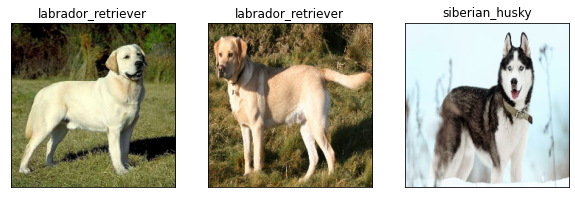

In [ ]:
# Check custom iamge predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)